In [2]:
import numpy as np
import matplotlib.pyplot as plt
import struct
import astropy.io.fits as fits
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.font_manager
import matplotlib as mpl
import matplotlib
npix = 512 
nfreq = 401


base = '/home/ppxjf3/RSD_LC/comparison/FINAL_LIGHTCONES_PEC_VEL_PAPER/'



column_width=240# call "\the\columnwidth" in LaTeX to find
ppi=72#default ppi, can be left the same

scale=2
fig_width=column_width/ppi*scale#inches
fig_height=3*scale#inches

##SET FONT SIZES
font_small_size = 9
font_medium_size = 12
font_bigger_size =14

plt.rc('font', size=font_small_size) # controls default text sizes
plt.rc('axes', titlesize=font_small_size) # fontsize of the axes title
plt.rc('axes', labelsize=font_medium_size) # fontsize of the x and y labels
plt.rc('xtick', labelsize=font_bigger_size) # fontsize of the tick labels
plt.rc('ytick', labelsize=font_bigger_size) # fontsize of the tick labels
plt.rc('legend', fontsize=font_small_size) # legend fontsize
plt.rc('figure', titlesize=font_bigger_size)


#correct font for MNRAS
#can be found at https://www.fontsquirrel.com/fonts/nimbus-roman-no9-l
#can be installed on Unix systems by putting unzipped folder in directory /home/{user}/.fonts
#run "fc-cache -v" in console to inform system of new font
#print(matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf'))
#plt.rc('font', family='Nimbus Roman')
# mpl.rcParams["font.family"] = "Nimbus Roman"
# mpl.rcParams['mathtext.fontset'] = 'custom'
# mpl.rcParams['mathtext.rm'] = 'Nimbus Roman'
# mpl.rcParams['mathtext.it'] = 'Nimbus Roman:italic'
# mpl.rcParams['mathtext.bf'] = 'Nimbus Roman:bold'
"""
plt.rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
plt.rc('text', usetex=True)
"""

#DPI of MNRAS is 300
mpl.rcParams['figure.dpi'] = 300/scale
# Set up a figure with four panels, with two rows and columns

/tmp/ipykernel_1789965/190070622.py:6: RuntimeWarning: divide by zero encountered in true_divide
  return (nu21 / x) - 1.0
/tmp/ipykernel_1789965/190070622.py:6: RuntimeWarning: divide by zero encountered in true_divide
  return (nu21 / x) - 1.0


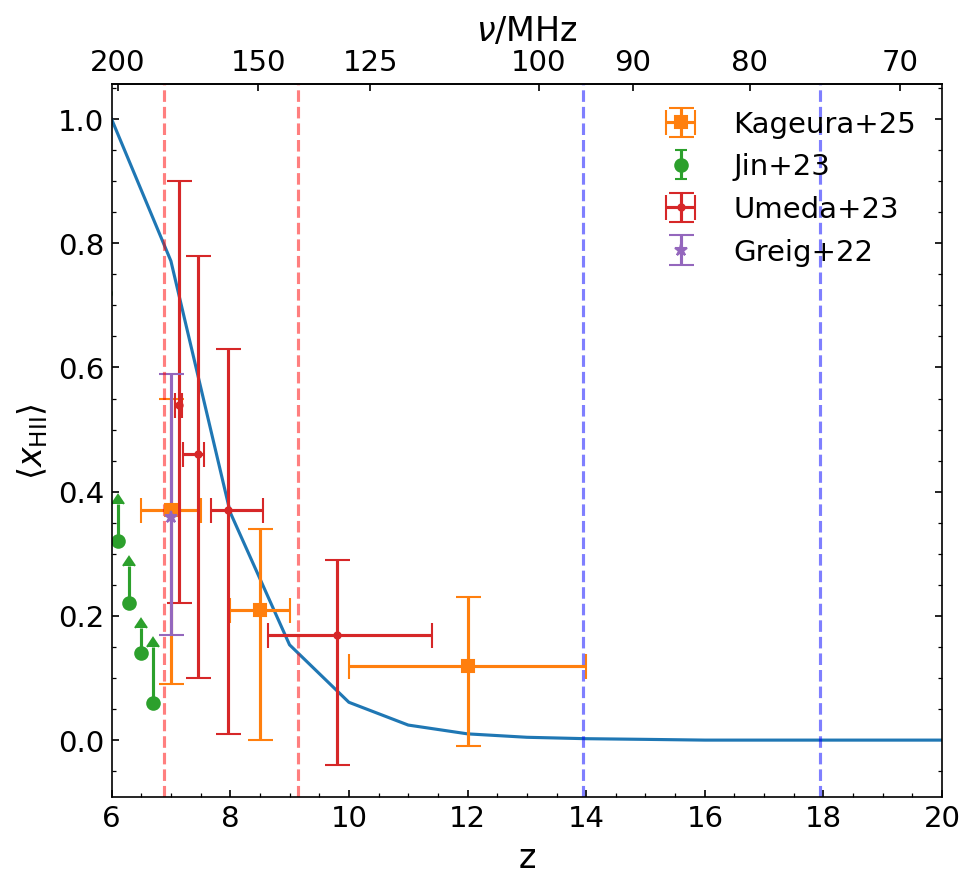

[[0.8494232 ]
 [0.84622189]
 [0.84302058]
 [0.83981928]
 [0.83661797]
 [0.83341666]
 [0.83021535]]


In [21]:
nu21 = 1.420405e3  #MHz
def z2nu(x):
    return nu21/(x+1.0)

def nu2z(x):
    return (nu21 / x) - 1.0

def NuFromz(z):
    """
    Convert frequency of 21cm line to redshift
    
    Input: nu [MHz]
    """
    nu21 = 1.420405e3  #MHz
    return nu21/(z + 1.0)

data = np.loadtxt('/home/ppxjf3/RSD_LC/comparison/FINAL_LIGHTCONES_PEC_VEL_PAPER/xHII_paper.txt')
#obvs data 
#McGreer 2015
y_mg15 = np.array([0.056, 0.368, 0.0382])
x_mg15 = np.array([5.86, 6.06, 5.58])
yerr_mg15 = [0.04,0.2,0.05]

#Greig 2018
y_g18 = 0.4
x_g18 = 7.1
yerr_g18 = np.array([(0.21,0.19)]).T

#Greig 2022
x_g22 = np.array([7])
y_g22 = np.array([0.64])
yerr_g22 = np.array([(0.19,0.23)]).T

#Jin 2023
x_j23 = np.array([5.5, 5.69, 5.89, 6.1, 6.3, 6.49, 6.69])
y_j23 = np.array([0.076, 0.16, 0.28, 0.68, 0.78, 0.86, 0.94])
yerr_j23 =  np.array([(0.08,0.08), (0.13,0.14), (0.07, 0.095), (0.055,0.06), (0.05,0.06), (0.03,0.04), (0.06,0.09)]).T

#Zhu 2022
y_z22 = np.array([0.167, 0.281,0.045])
x_z22 = np.array([5.76, 5.94, 5.53])
err_z22 = np.array([0.09, 0.09, 0.03])

#Umeda 2023
x_u23 = np.array([7.14, 7.452, 7.96, 9.801])
y_u23 = np.array([0.46, 0.54, 0.63, 0.83])
yerr_u23 = np.array([(0.32, 0.36),(0.36,0.32),(0.36,0.26),(0.21,0.12)]).T
xerr_u23 = np.array([(0.076, 0.039), (0.251,0.1),(0.277,0.586),(1.164,1.599)]).T

#Kageura 25
x_k25 = np.array([7, 8.5, 12])
y_k25 = np.array([0.63,0.79,0.88])
yerr_k25 = np.array([(0.28, 0.18),(0.21,0.13),(0.13,0.11)]).T
xerr_k25 = np.array([(0.5,0.5),(0.5,0.5),(2.0,2.0)]).T


fig, ax = plt.subplots(figsize=(fig_width, fig_height),
                       nrows=1, ncols=1,)

ax.plot(data[0,:],data[1,:])
ax.errorbar(x_k25, 1- y_k25, linestyle ='None', yerr = yerr_k25, xerr=xerr_k25, label = 'Kageura+25', capsize=6, fmt='s')
#ax.errorbar(x_g18, 1-y_g18, yerr= yerr_g18, linestyle ='None', label = 'Greig+18', capsize=6)
#ax.errorbar(x_mg15, 1-y_mg15, yerr= yerr_mg15, linestyle ='None', label = 'McGreer+15',   lolims=True, color = 'b', fmt="X")
#ax.errorbar(x_z22, 1- y_z22, linestyle ='None', yerr = err_z22, label = 'Zhu+22', lolims=True)
ax.errorbar(x_j23, 1- y_j23, linestyle ='None', yerr = yerr_j23, label = 'Jin+23', lolims=True, fmt='o')
ax.errorbar(x_u23, 1- y_u23, linestyle ='None', yerr = yerr_u23, xerr=xerr_u23, label = 'Umeda+23', capsize=6, fmt='.')
ax.errorbar(x_g22, 1- y_g22, yerr= yerr_g22, linestyle ='None', capsize=6, label = 'Greig+22', fmt='*')
ax.set_xlabel(r'$\rm z$', fontsize=16)
ax.set_ylabel(r'$ \langle x_{\rm HII} \rangle$', fontsize=16)
ax.set_xlim(left=6.0, right=25.0)
ax.axvline(nu2z(180), color='r', linestyle='dashed', alpha=0.5)
ax.axvline(nu2z(140), color='r', linestyle='dashed', alpha=0.5)
ax.axvline(nu2z(95), color='b', linestyle='dashed', alpha=0.5)
ax.axvline(nu2z(75), color='b', linestyle='dashed', alpha=0.5)
plt.legend(frameon=False, fontsize=14)

ax2 = ax.secondary_xaxis('top', functions=(z2nu, nu2z))
ax2.set_xlabel(r'$\nu /\rm MHz$', fontsize=16)
# Define specific frequency markers (e.g., 50 MHz to 200 MHz in steps of 25 MHz)
freq_ticks = [200,150,125,100,90,80,70,65,60,55]

# Set the tick locations on the secondary x-axis
ax2.set_xticks(freq_ticks)  # Set the tick positions in MHz
ax2.tick_params(direction="in")
ax.yaxis.set_ticks_position('both')
ax.tick_params(axis="both",which="both",direction="in")
plt.minorticks_on()
plt.tight_layout()
plt.xlim(right=20.0)
plt.savefig('/home/ppxjf3/RSD_LC/comparison/FINAL_LIGHTCONES_PEC_VEL_PAPER/graphs_for_paper/xHI_check.pdf', dpi=330)
plt.show()


#interpolate onto same grid for ratio
z_interp = np.linspace(6.0, 20.0, 1000)
xHII_interp = np.interp(z_interp, data[0,:],data[1,:])
ii = np.argwhere(np.round(z_interp,decimals=1)==np.round(nu2z(185.0),decimals=1))
print(xHII_interp[ii])

In [3]:

matplotlib.style.use('/home/ppxjf3/paper_params.mplstyle') 
with open(base + 'nuslicecount_N512_FOV1.0000_dnu1.00MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    nuslicecount_1 = struct.unpack('i' * (len(data) // struct.calcsize('i')), data)
    
nuslicecount_1 = np.array(nuslicecount_1)/(npix*npix)
nuslicecount_1 = nuslicecount_1.reshape(41+10,41)

with open(base + 'nuslicecount_N512_FOV1.0000_dnu0.50MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    nuslicecount_05 = struct.unpack('i' * (len(data) // struct.calcsize('i')), data)
    
nuslicecount_05 = np.array(nuslicecount_05)/(npix*npix)
nuslicecount_05 = nuslicecount_05.reshape(81+10,81)

In [4]:
with open(base + 'nuslicecount_N512_FOV1.0000_dnu0.01MHz_170.00MHz_160.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    nuslicecount_001 = struct.unpack('i' * (len(data) // struct.calcsize('i')), data)
    
nuslicecount_001 = np.array(nuslicecount_001)/(npix*npix)
nuslicecount_001 = nuslicecount_001.reshape(1001+10,1001)


In [5]:

from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

# Open the file in binary read mode
with open(base + 'nuslicecount_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    nuslicecount_01 = struct.unpack('i' * (len(data) // struct.calcsize('i')), data)
    
# Convert the tuple to a NumPy array
nuslicecount_01 = np.array(nuslicecount_01)/(npix*npix)
nuslicecount_01 = nuslicecount_01.reshape(nfreq+10,nfreq)



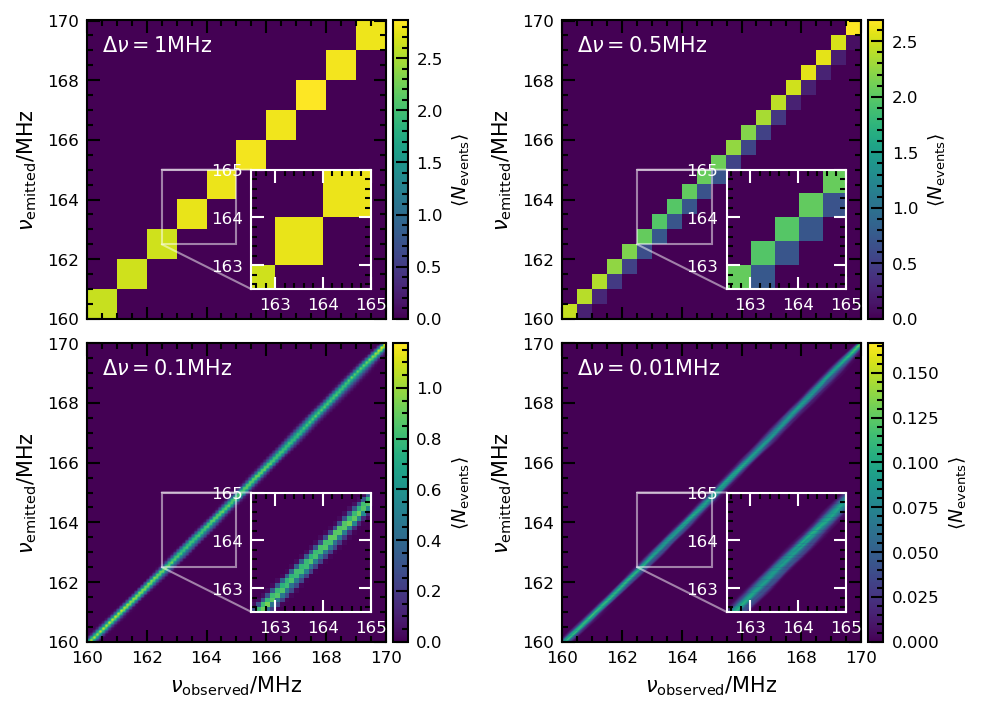

In [6]:

extent_01 = [160.0, 170.0, 160, 170]

fig, ax = plt.subplots(figsize=(fig_width*1.0, fig_height*0.8),
                       nrows=2, ncols=2, sharex=True)
fig.subplots_adjust(hspace=0.2, wspace=0.2)


pmc_rsd = ax[1,0].imshow(nuslicecount_01[205:305,200:300], extent=extent_01, origin='lower')

x1, x2, y1, y2 = 162.5, 165,  162.5, 165  # subregion of the original image
axins = ax[1,0].inset_axes(
    [0.55, 0.1, 0.4, 0.4],
    xlim=(x1, x2), ylim=(y1, y2))
axins.imshow(nuslicecount_01[205:305,200:300], extent=extent_01, origin='lower')
# Change the color of the spines (outer border of the inset)
for spine in axins.spines.values():
    spine.set_edgecolor("white")

# Change the tick colors
axins.tick_params(axis='both', colors="white", labelsize=8)  # Set tick and tick label color to white

ax[1,0].indicate_inset_zoom(axins, edgecolor="white")

pmc_1 = ax[0,0].imshow(nuslicecount_1[25:35,20:30], extent=extent_01, origin='lower')

# inset Axes....
x1, x2, y1, y2 = 162.5, 165,  162.5, 165   # subregion of the original image
axins = ax[0,0].inset_axes(
    [0.55, 0.1, 0.4, 0.4],
    xlim=(x1, x2), ylim=(y1, y2))
axins.imshow(nuslicecount_1[25:35,20:30], extent=extent_01, origin='lower')
# Change the color of the spines (outer border of the inset)
for spine in axins.spines.values():
    spine.set_edgecolor("white")

# Change the tick colors
axins.tick_params(axis='both', colors="white",  labelsize=8)  # Set tick and tick label color to white
ax[0,0].indicate_inset_zoom(axins, edgecolor="white")

pmc_05 = ax[0,1].imshow(nuslicecount_05[45:65,40:60], extent=extent_01, origin='lower')

# inset Axes....
x1, x2, y1, y2 = 162.5, 165,  162.5, 165   # subregion of the original image
axins = ax[0,1].inset_axes(
    [0.55, 0.1, 0.4, 0.4],
    xlim=(x1, x2), ylim=(y1, y2))
axins.imshow(nuslicecount_05[45:65,40:60], extent=extent_01, origin='lower')
# Change the color of the spines (outer border of the inset)
for spine in axins.spines.values():
    spine.set_edgecolor("white")

# Change the tick colors
axins.tick_params(axis='both', colors="white", labelsize=8)  # Set tick and tick label color to white
ax[0,1].indicate_inset_zoom(axins, edgecolor="white")

pmc_01 = ax[1,1].imshow(nuslicecount_001[5:1005,:], extent=extent_01, origin='lower')

# inset Axes....
x1, x2, y1, y2 = 162.5, 165,  162.5, 165 # subregion of the original image
axins = ax[1,1].inset_axes(
    [0.55, 0.1, 0.4, 0.4],
    xlim=(x1, x2), ylim=(y1, y2))
axins.imshow(nuslicecount_001[5:1005,:], extent=extent_01, origin='lower')
# Change the color of the spines (outer border of the inset)
for spine in axins.spines.values():
    spine.set_edgecolor("white")

# Change the tick colors
axins.tick_params(axis='both', colors="white", labelsize=8)  # Set tick and tick label color to white

ax[1,1].indicate_inset_zoom(axins, edgecolor="white")

ax[0,0].set_ylabel(r'$\nu_{\rm emitted} / \rm MHz$', fontsize=10)
ax[1,0].set_ylabel(r'$\nu_{\rm emitted} / \rm MHz$', fontsize=10)
ax[0,1].set_ylabel(r'$\nu_{\rm emitted} / \rm MHz$', fontsize=10)
ax[1,1].set_ylabel(r'$\nu_{\rm emitted} / \rm MHz$', fontsize=10)
ax[1,0].set_xlabel(r'$\nu_{\rm observed} / \rm MHz$', fontsize=10)
ax[1,1].set_xlabel(r'$\nu_{\rm observed} / \rm MHz$', fontsize=10)

ax[1,0].text(0.05,0.95, r'$\Delta \nu = 0.1 \rm MHz$',transform=ax[1,0].transAxes, ha='left', va='top', fontsize =10, color='white')
divider = make_axes_locatable(ax[1,0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc_rsd, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \langle N_{\rm events} \rangle $', size='medium')
cb.ax.tick_params(labelsize=8)

ax[0,0].text(0.05,0.95, r'$\Delta \nu = 1 \rm MHz$',transform=ax[0,0].transAxes, ha='left', va='top', fontsize =10, color='white')
divider = make_axes_locatable(ax[0,0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc_1, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \langle N_{\rm events} \rangle $', size='medium')
cb.ax.tick_params(labelsize=8)

ax[0,1].text(0.05,0.95, r'$\Delta \nu = 0.5 \rm MHz$',transform=ax[0,1].transAxes, ha='left', va='top', fontsize =10, color='white')
divider = make_axes_locatable(ax[0,1])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc_05, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \langle N_{\rm events} \rangle $', size='medium')
cb.ax.tick_params(labelsize=8)

ax[1,1].text(0.05,0.95, r'$\Delta \nu = 0.01 \rm MHz$',transform=ax[1,1].transAxes, ha='left', va='top', fontsize =10, color='white')
divider = make_axes_locatable(ax[1,1])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc_01, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \langle N_{\rm events} \rangle $', size='medium')
cb.ax.tick_params(labelsize=8)

ax[0,0].tick_params(axis='both', labelsize=8)  # Adjust the label size for subplot ax[0,0]
ax[0,1].tick_params(axis='both', labelsize=8)
ax[1,0].tick_params(axis='both', labelsize=8)
ax[1,1].tick_params(axis='both', labelsize=8)


plt.tight_layout(pad=1, h_pad=0.5, w_pad=0.5)  
plt.savefig(base + 'graphs_for_paper/nu_slice_counter.pdf', dpi=330, bbox_inches='tight')
plt.show()





2.717394013060001


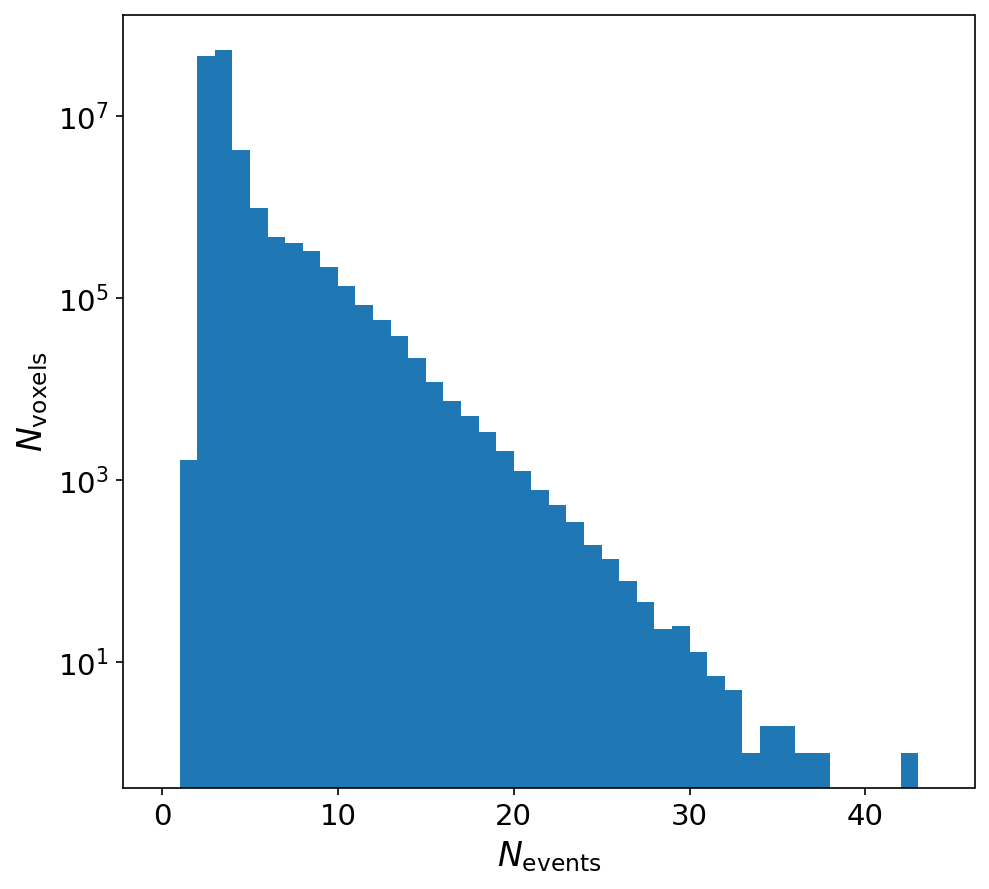

[[ 30 248 304]]


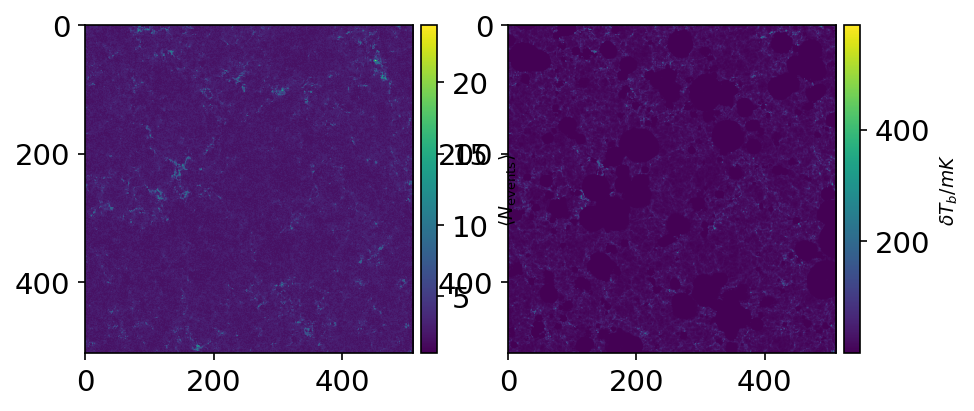

"one_event = one_event.reshape(npix,npix,nfreq)\n\n\nBINS = np.arange(0, int(np.max(one_event)),1.0)\nprint(np.max(one_event))\nprint(np.mean(one_event))\n\n\nfig, ax = plt.subplots(figsize=(fig_width, fig_height),\n                       nrows=1, ncols=1,)\nax.hist(one_event.reshape((512*512*401)), bins=BINS)\n#plt.ylims(1,1000000000)\nax.set_yscale('log')\nax.set_ylabel(r'$N_{\rm voxels}$')\nax.set_xlabel(r'$N_{\rm events}$')\nplt.savefig(base + 'graphs_for_paper/onevent_hist_whole_lc.pdf', dpi=330)\nplt.show()"

In [3]:

with open(base + 'Oneevent_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    one_event = struct.unpack('i' * (len(data) // struct.calcsize('i')), data)
oneevent = np.array(one_event)

print(np.mean(oneevent))
BINS = np.arange(0.0, 45.0,1.0)
fig, ax = plt.subplots(figsize=(fig_width, fig_height),
                       nrows=1, ncols=1,)
ax.hist(oneevent.reshape((512*512*401)), bins=BINS)
ax.set_yscale('log')
ax.set_ylabel(r'$N_{\rm voxels}$', fontsize=16)
ax.set_xlabel(r'$N_{\rm events}$', fontsize=16)
plt.tight_layout()
plt.savefig('/home/ppxjf3/RSD_LC/comparison/FINAL_LIGHTCONES_PEC_VEL_PAPER/graphs_for_paper/onevent_hist_whole_lc.pdf', dpi=330)
plt.show()
oneevent = oneevent.reshape(npix, npix, nfreq)
print(np.argwhere(oneevent==42))



with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    RSD = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)

RSD_z01_nu01_1deg = np.array(RSD)*1e3
RSD_z01_nu01_1deg = RSD_z01_nu01_1deg.reshape(npix,npix,nfreq)

idx = 140
fig, ax = plt.subplots(figsize=(fig_width, fig_height),
                       nrows=1, ncols=2,)

pmc =ax[0].imshow(oneevent[:,:,304])
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \langle N_{\rm events} \rangle $', size='medium')

pmc =ax[1].imshow(RSD_z01_nu01_1deg[:,:,304])
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \delta T_b /mK $', size='medium')
plt.show()
"""with open(base + 'Oneevent_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.059911_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10_10ds.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    one_event = struct.unpack('i' * (len(data) // struct.calcsize('i')), data)
oneevent = np.array(one_event)
print(np.max(oneevent))
print(np.mean(oneevent))
BINS = np.arange(0, int(np.max(oneevent)),1.0)
fig, ax = plt.subplots(figsize=(fig_width, fig_height),
                       nrows=1, ncols=1,)
ax.hist(oneevent.reshape((512*512*401)), bins=BINS)
ax.set_yscale('log')
ax.set_ylabel(r'$N_{\rm voxels}$', fontsize=16)
ax.set_xlabel(r'$N_{\rm events}$', fontsize=16)
plt.tight_layout()
plt.show()"""

"""one_event = one_event.reshape(npix,npix,nfreq)


BINS = np.arange(0, int(np.max(one_event)),1.0)
print(np.max(one_event))
print(np.mean(one_event))


fig, ax = plt.subplots(figsize=(fig_width, fig_height),
                       nrows=1, ncols=1,)
ax.hist(one_event.reshape((512*512*401)), bins=BINS)
#plt.ylims(1,1000000000)
ax.set_yscale('log')
ax.set_ylabel(r'$N_{\rm voxels}$')
ax.set_xlabel(r'$N_{\rm events}$')
plt.savefig(base + 'graphs_for_paper/onevent_hist_whole_lc.pdf', dpi=330)
plt.show()"""

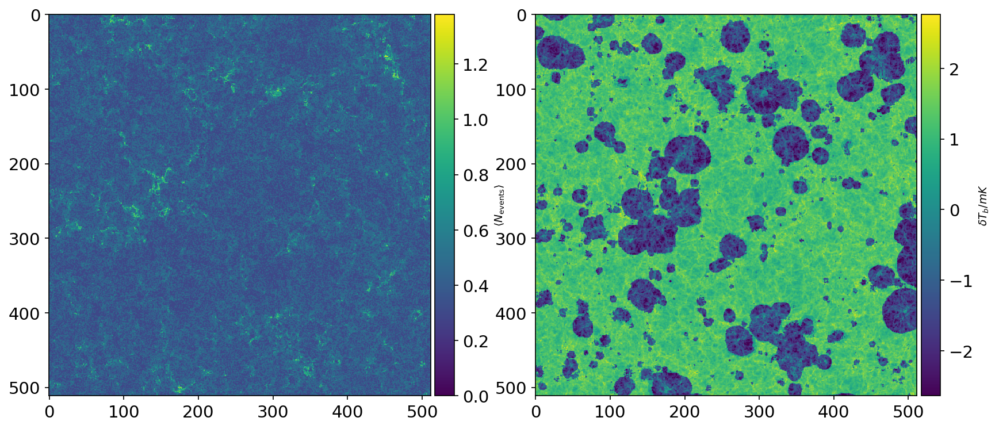

/tmp/ipykernel_2375248/2846720417.py:20: RuntimeWarning: invalid value encountered in log10
  plt.imshow(np.log10(oneevent[:,:,idx]-2.7), cmap='Greys')


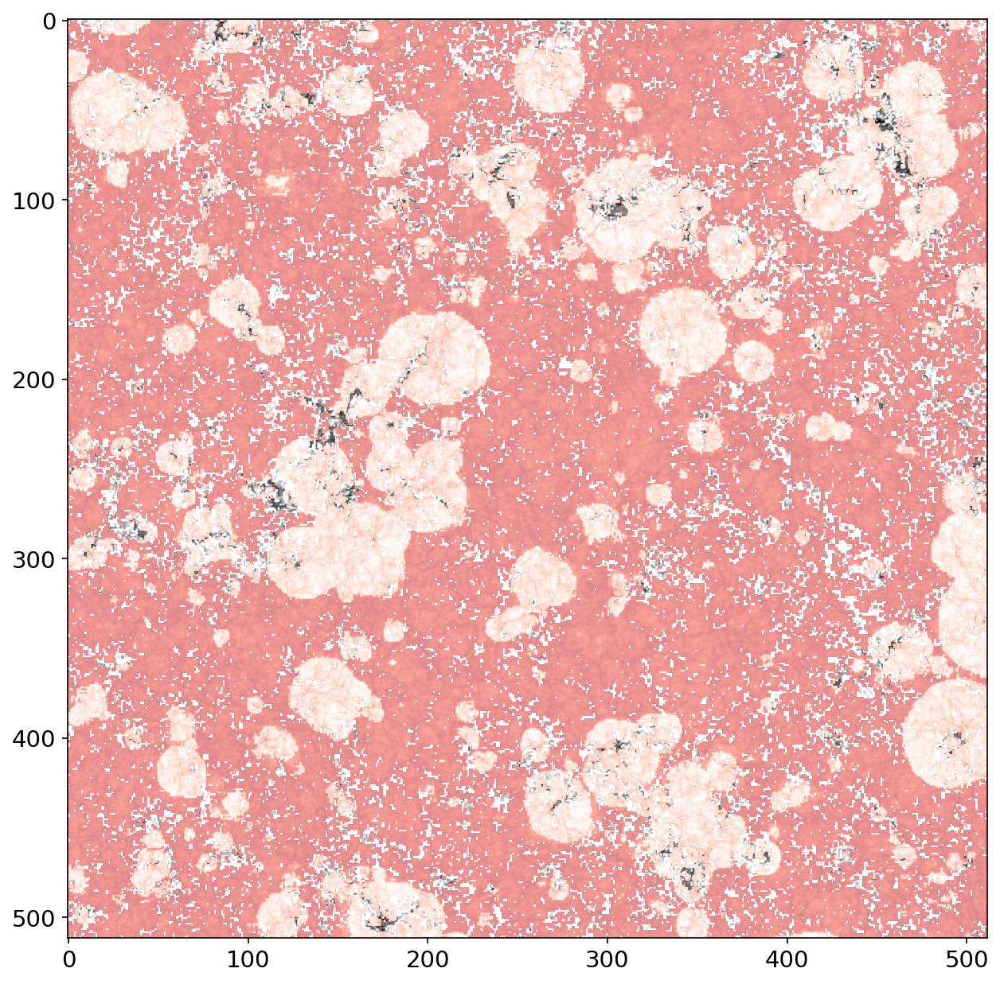

In [18]:
idx = 140
fig, ax = plt.subplots(figsize=(fig_width*2, fig_height),
                       nrows=1, ncols=2,)

pmc =ax[0].imshow(np.log10(oneevent[:,:,idx]))
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \langle N_{\rm events} \rangle $', size='medium')

pmc =ax[1].imshow(np.log10(RSD_z01_nu01_1deg[:,:,idx]))
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \delta T_b /mK $', size='medium')
plt.show()

plt.figure(figsize = (10,10))
plt.imshow(np.log10(RSD_z01_nu01_1deg[:,:,idx]), alpha=0.5, cmap='Reds')
plt.imshow(np.log10(oneevent[:,:,idx]-2.7), cmap='Greys')

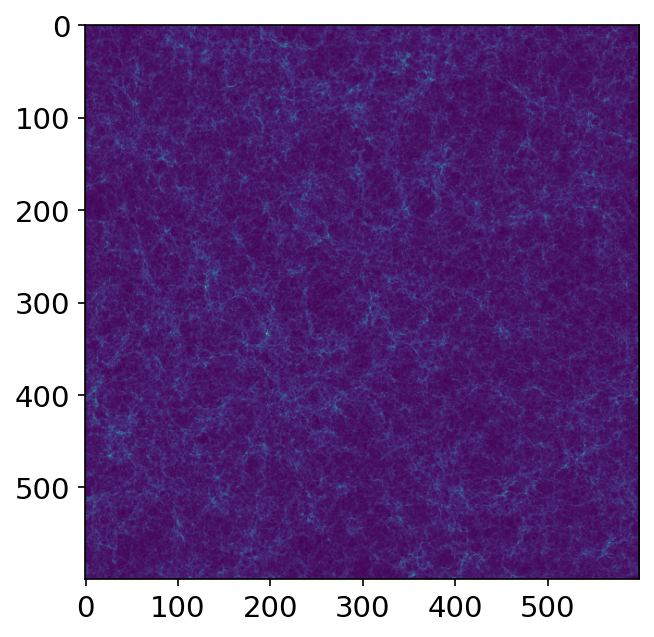

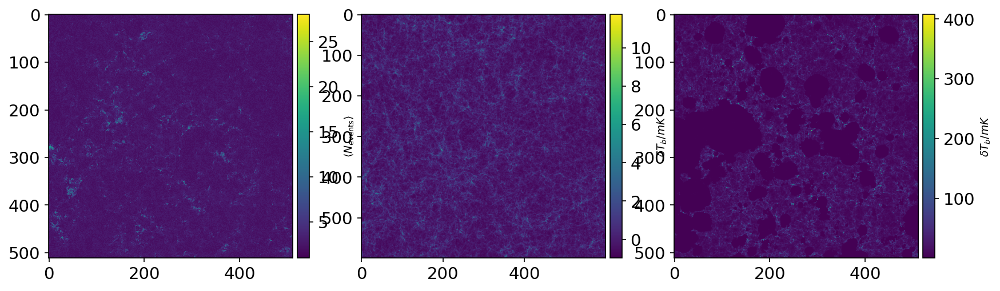

/tmp/ipykernel_2375248/2141782149.py:38: RuntimeWarning: invalid value encountered in log10
  plt.imshow(np.log10(deltanl_z8[:,:,idx]), alpha=0.5, cmap='Reds')
/tmp/ipykernel_2375248/2141782149.py:39: RuntimeWarning: invalid value encountered in log10
  plt.imshow(np.log10(oneevent[:,:,idx]-2.7), cmap='Greys')


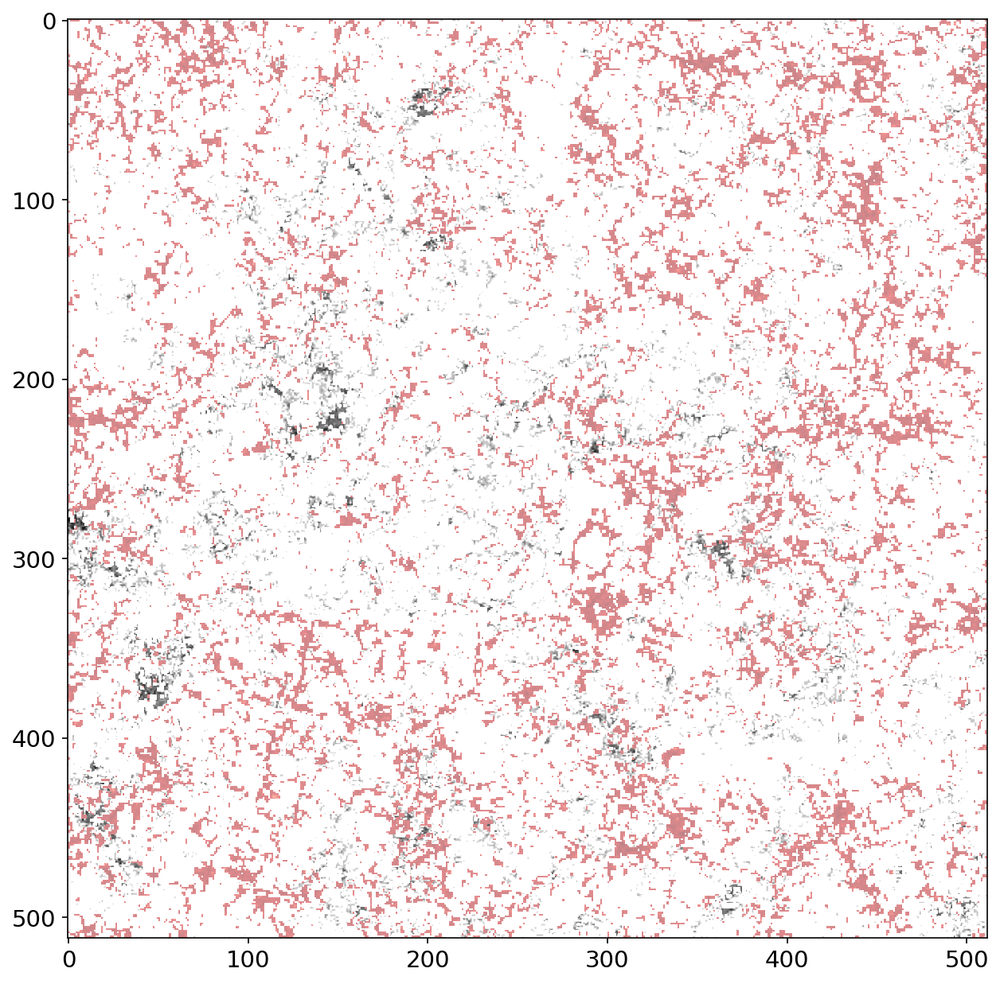

In [22]:
# Open the file in binary read mode
with open(base + 'deltanl_z10.000_N600_L200.0.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    deltanl_z8 = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
    
deltanl_z8 = np.array(deltanl_z8)

deltanl_z8 = deltanl_z8.reshape(600,600,600)
plt.imshow(deltanl_z8[:,:,0])
plt.show()
idx = 177
fig, ax = plt.subplots(figsize=(fig_width*2, fig_height),
                       nrows=1, ncols=3,)

pmc =ax[0].imshow(oneevent[:,:,idx])
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \langle N_{\rm events} \rangle $', size='medium')

pmc =ax[1].imshow(deltanl_z8[:,:,0])
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \delta T_b /mK $', size='medium')

pmc =ax[2].imshow(RSD_z01_nu01_1deg[:,:,idx])
divider = make_axes_locatable(ax[2])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \delta T_b /mK $', size='medium')
plt.show()

plt.figure(figsize = (10,10))
plt.imshow(np.log10(deltanl_z8[:,:,idx]), alpha=0.5, cmap='Reds')
plt.imshow(np.log10(oneevent[:,:,idx]-2.7), cmap='Greys')

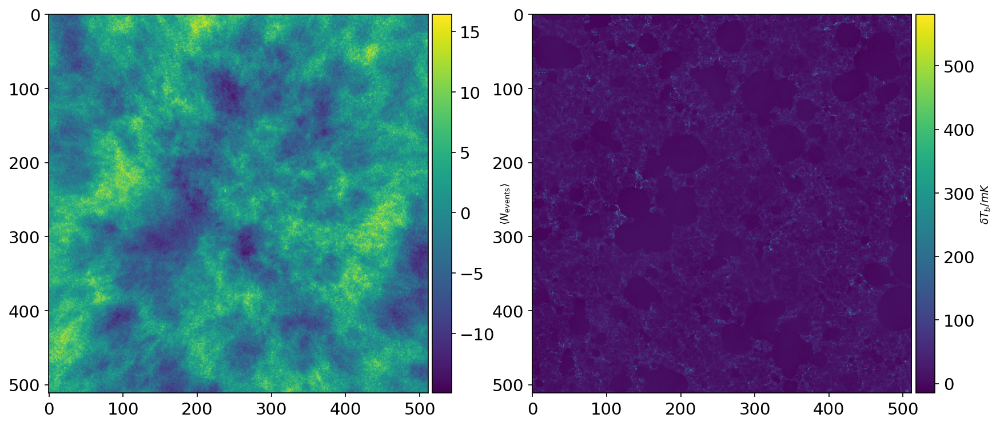

In [10]:
from sklearn.decomposition import FastICA
def do_fastica(data, comps):
    shape = data.shape
    f_ica = FastICA(n_components=comps)
    #generate the 4 componets
    S = f_ica.fit_transform(data.reshape((shape[0]*shape[1],shape[2])))
    
    #get mixing matrix
    A = f_ica.mixing_
    
    #make model
    model_fICA = (np.matmul(A,S.T).T).reshape((shape[0],shape[1],shape[2]))
    
    #get resids
    resids_fICA = data - model_fICA #residuals 
    
    return model_fICA, resids_fICA

model, resids = do_fastica(RSD_z01_nu01_1deg, 3)



/tmp/ipykernel_2375248/3824907522.py:11: RuntimeWarning: invalid value encountered in log10
  pmc =ax[1].imshow(np.log10(resids[:,:,idx]))


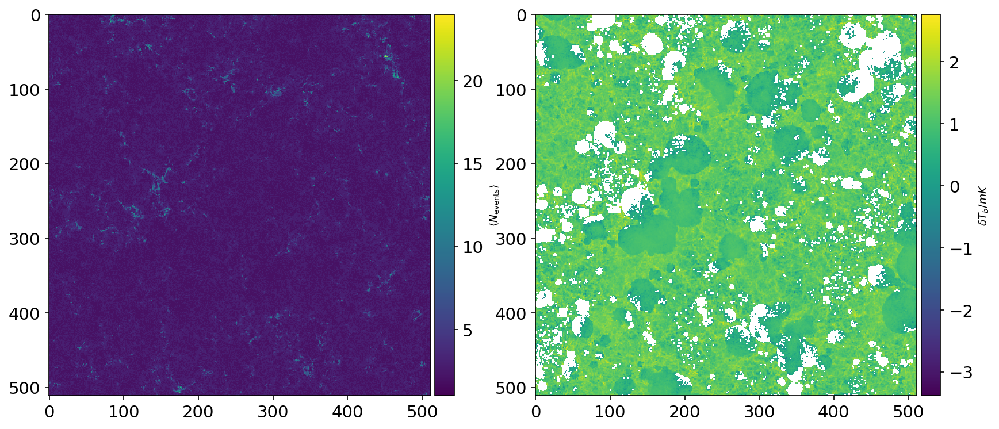

In [11]:
idx = 140
fig, ax = plt.subplots(figsize=(fig_width*2, fig_height),
                       nrows=1, ncols=2,)

pmc =ax[0].imshow(oneevent[:,:,idx])
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \langle N_{\rm events} \rangle $', size='medium')

pmc =ax[1].imshow(np.log10(resids[:,:,idx]))
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = fig.colorbar(pmc, cax=cax, orientation='vertical')
cb.set_label(label=r'$ \delta T_b /mK $', size='medium')
plt.show()

0.0
2.9548492431640625


/tmp/ipykernel_2113503/2880755526.py:55: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=1.0, rect=[0, 0, 0.8, 1])  # Ensure subplots don't encroach the right margin


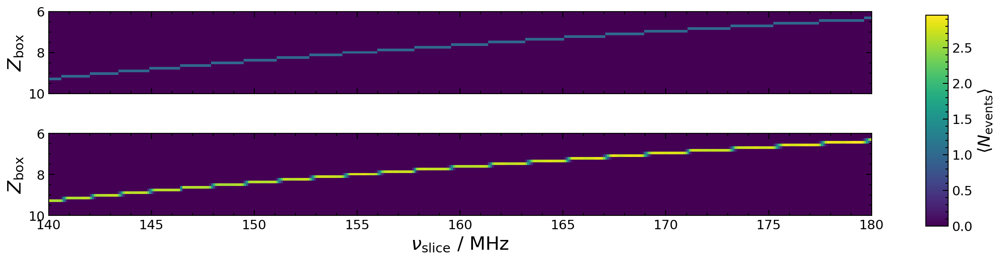

In [8]:
npix = 512 
nfreq = 401
nz = 31
# Open the file in binary read mode
with open(base + 'z_nu_array_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    z_nu_rsd = struct.unpack('i' * (len(data) // struct.calcsize('i')), data)
    
# Convert the tuple to a NumPy array
z_nu_rsd = np.array(z_nu_rsd)/(npix*npix)
z_nu_rsd = z_nu_rsd.reshape(nz,nfreq)

with open(base + 'z_nu_array_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.014978_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    z_nu = struct.unpack('i' * (len(data) // struct.calcsize('i')), data)
    
# Convert the tuple to a NumPy array
z_nu = np.array(z_nu)/(npix*npix)
z_nu = z_nu.reshape(nz,nfreq)

vmin = np.min([z_nu, z_nu_rsd])
vmax = np.max([z_nu, z_nu_rsd])
print(vmin)
print(vmax)
fig, ax = plt.subplots(figsize=(fig_width * 2.5, fig_height*0.75),  # Adjust figure width
                       nrows=2, ncols=1, sharex=True)

# Reduce white space between subplots
fig.subplots_adjust(hspace=0.05,  # Minimal vertical space between subplots
                    left=0.1, right=0.8,  # Adjust left and right margins
                    top=0.95, bottom=0.1)  # Adjust top and bottom margins

# Plot the images
pmc = ax[0].imshow(z_nu, extent=[140.0, 180.0, 10.0, 6.0], vmin=vmin, vmax=vmax)
ax[0].set_ylabel(r'$Z_{\rm box}$', fontsize=20)

pmc = ax[1].imshow(z_nu_rsd, extent=[140.0, 180.0, 10.0, 6.0], vmin=vmin, vmax=vmax)
ax[1].set_xlabel(r'$\nu_{\rm slice}$ / MHz', fontsize=20)
ax[1].set_ylabel(r'$Z_{\rm box}$', fontsize=20)

# Add a more compact colorbar
# Adjust the position to avoid overlap
cbar_ax = fig.add_axes([0.83, 0.15, 0.02, 0.7])  # (x, y, width, height)
cb = fig.colorbar(pmc, cax=cbar_ax)
cb.ax.tick_params(labelsize=14)
cb.set_label(label=r'$\langle N_{\rm events} \rangle$', size=18)

# Use tight layout for fine adjustments
plt.tight_layout(pad=1.0, rect=[0, 0, 0.8, 1])  # Ensure subplots don't encroach the right margin
ax[0].tick_params(axis='y', labelsize=14)
ax[1].tick_params(axis='both', labelsize=14)
# Save with minimal white space
plt.savefig(base + 'graphs_for_paper/nu_zbox_counter.pdf', dpi=330, bbox_inches='tight')

plt.show()



In [4]:

base = '/home/ppxjf3/RSD_LC/comparison/FINAL_LIGHTCONES_PEC_VEL_PAPER/'
npix=512
nfreq=201

        
with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_200.00MHz_180.00MHz_ds0.016048_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z01_nu01_1deg = np.array(LC)*1e3
LC_z01_nu01_1deg = LC_z01_nu01_1deg.reshape(npix,npix,nfreq)

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_200.00MHz_180.00MHz_ds0.016048_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.50.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z05_nu01_1deg = np.array(LC)*1e3
LC_z05_nu01_1deg = LC_z05_nu01_1deg.reshape(npix,npix,nfreq)

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_200.00MHz_180.00MHz_ds0.014042_div00.00_pv1_oneevent0_evo1_lcon1_dz_001.00.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z1_nu01_1deg = np.array(LC)*1e3
LC_z1_nu01_1deg = LC_z1_nu01_1deg.reshape(npix,npix,nfreq)


with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.50MHz_200.00MHz_180.00MHz_ds0.016048_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z01_nu05_1deg = np.array(LC)*1e3
LC_z01_nu05_1deg = LC_z01_nu05_1deg.reshape(npix,npix,41)

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu1.00MHz_200.00MHz_180.00MHz_ds0.016048_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z01_nu1_1deg = np.array(LC)*1e3
LC_z01_nu1_1deg = LC_z01_nu1_1deg.reshape(npix,npix,21)

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu1.00MHz_190.00MHz_180.00MHz_ds0.006419_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z01_nu1_1deg = np.array(LC)*1e3
RSD_z01_nu1_1deg = RSD_z01_nu1_1deg.reshape(npix,npix,11)

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_190.00MHz_180.00MHz_ds0.006419_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.50.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z05_nu01_1deg = np.array(LC)*1e3
RSD_z05_nu01_1deg = RSD_z05_nu01_1deg.reshape(npix,npix,101)

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_200.00MHz_180.00MHz_ds0.005617_div00.00_pv1_oneevent0_evo1_lcon0_dz_001.00.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z1_nu01_1deg = np.array(LC)*1e3
RSD_z1_nu01_1deg = RSD_z1_nu01_1deg.reshape(npix,npix,201)


with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.50MHz_190.00MHz_180.00MHz_ds0.006419_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z01_nu05_1deg = np.array(LC)*1e3
RSD_z01_nu05_1deg = RSD_z01_nu05_1deg.reshape(npix,npix,21)

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_190.00MHz_180.00MHz_ds0.006419_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z01_nu01_1deg = np.array(LC)*1e3
RSD_z01_nu01_1deg = RSD_z01_nu01_1deg.reshape(npix,npix,101)


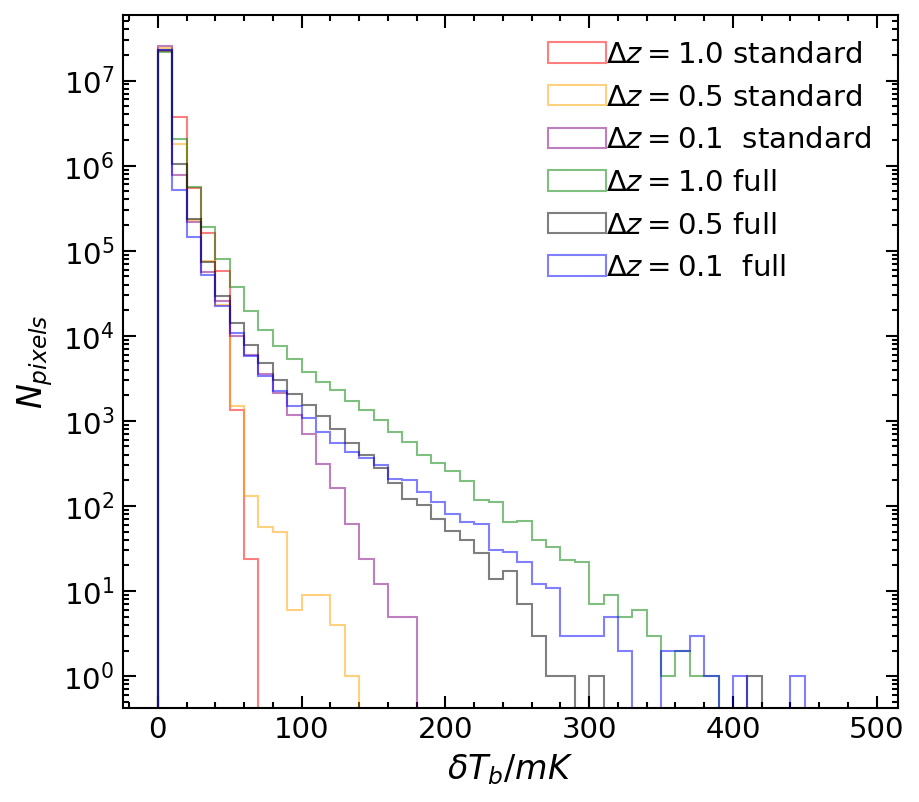

In [5]:
i0 = 0
i1 = 101


BINS = np.arange(0,500.0,10.0)


fig, ax = plt.subplots(figsize=(fig_width, fig_height),
                       nrows=1, ncols=1,)
fig.subplots_adjust(wspace=0)
ax.hist(LC_z1_nu01_1deg[:,:,i0:i1].reshape((512*512*101)), bins=BINS, color='red', histtype='step', alpha=0.5, label=r'$\Delta z = 1.0$ standard')
ax.hist(LC_z05_nu01_1deg[:,:,i0:i1].reshape((512*512*101)), bins=BINS, color='orange', histtype='step', alpha=0.5, label=r'$\Delta z = 0.5$ standard')
ax.hist(LC_z01_nu01_1deg[:,:,i0:i1].reshape((512*512*101)), bins=BINS, color='purple', histtype='step', alpha=0.5, label=r'$\Delta z = 0.1$  standard')
ax.hist(RSD_z1_nu01_1deg[:,:,i0:i1].reshape((512*512*101)), bins=BINS, color='green', histtype='step', alpha=0.5, label=r'$\Delta z = 1.0$ full')
ax.hist(RSD_z05_nu01_1deg[:,:,i0:i1].reshape((512*512*101)), bins=BINS, color='k', histtype='step', alpha=0.5, label=r'$\Delta z = 0.5$ full')
ax.hist(RSD_z01_nu01_1deg[:,:,i0:i1].reshape((512*512*101)), bins=BINS, color='blue', histtype='step', alpha=0.5, label=r'$\Delta z = 0.1$  full')
#ax.text(0.35,0.95, r'$\nu = 195 \rm MHz$',transform=ax.transAxes, ha='right', va='top', fontsize=14)
ax.set_yscale('log')
ax.set_ylabel(r'$N_{pixels}$', fontsize=16)
ax.set_xlabel(r'$\delta T_b /mK$', fontsize=16)
ax.legend(frameon=False, fontsize=14)
plt.savefig('/home/ppxjf3/RSD_LC/comparison/FINAL_LIGHTCONES_PEC_VEL_PAPER/graphs_for_paper/redshift_resolution_histogram.pdf', dpi=330, bbox_inches='tight')
plt.show()

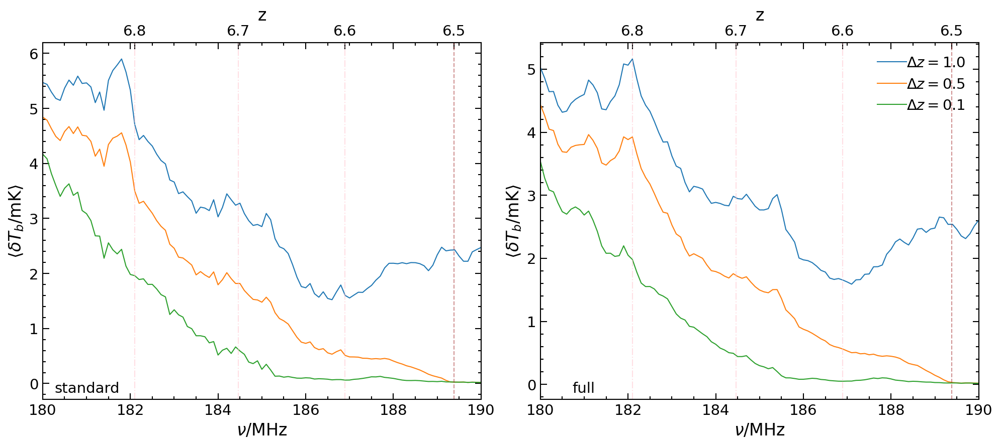

In [6]:
freq = np.arange(180, 200.1, 0.1)
freq2 = np.arange(180, 190.1, 0.1)
z = np.arange(6.0, 10.0, 0.1)

nu = NuFromz(z)

TB_LC_z1_nu01_1deg = np.empty([LC_z1_nu01_1deg.shape[2]])
TB_LC_z05_nu01_1deg = np.empty([LC_z05_nu01_1deg.shape[2]])
TB_LC_z01_nu01_1deg = np.empty([LC_z01_nu01_1deg.shape[2]])

TB_RSD_z1_nu01_1deg = np.empty([RSD_z1_nu01_1deg.shape[2]])
TB_RSD_z05_nu01_1deg = np.empty([RSD_z05_nu01_1deg.shape[2]])
TB_RSD_z01_nu01_1deg = np.empty([RSD_z01_nu01_1deg.shape[2]])

for ii in range(0,LC_z01_nu01_1deg.shape[2]):
    TB_LC_z1_nu01_1deg[ii] = np.mean(LC_z1_nu01_1deg[:,:,ii])
    TB_LC_z05_nu01_1deg[ii] = np.mean(LC_z05_nu01_1deg[:,:,ii])
    TB_LC_z01_nu01_1deg[ii] = np.mean(LC_z01_nu01_1deg[:,:,ii])
    TB_RSD_z1_nu01_1deg[ii] = np.mean(RSD_z1_nu01_1deg[:,:,ii])
for ii in range(0,RSD_z05_nu01_1deg.shape[2]):
    TB_RSD_z05_nu01_1deg[ii] = np.mean(RSD_z05_nu01_1deg[:,:,ii])
    TB_RSD_z01_nu01_1deg[ii] = np.mean(RSD_z01_nu01_1deg[:,:,ii])


fig, ax = plt.subplots(figsize=(fig_width*2, fig_height),
                       nrows=1, ncols=2,)
ax[0].plot(freq, TB_LC_z1_nu01_1deg, label=r'$\Delta z =1.0 $')
ax[0].plot(freq, TB_LC_z05_nu01_1deg, label=r'$\Delta z =0.5 $')
ax[0].plot(freq, TB_LC_z01_nu01_1deg, label=r'$\Delta z =0.1 $')
ax[0].set_ylabel(r'$ \langle \delta T_b / \rm mK \rangle$', fontsize=16)
ax[0].set_xlabel(r'$\nu / \rm MHz$', fontsize=16)
ax[0].text(0.175,0.05, 'standard',transform=ax[0].transAxes, ha='right', va='top', fontsize=14)
ax[0].set_xlim(180,190)
lines = ['dotted', 'dashdot', 'dashdot', 'dashdot', 'dashdot', 'dashed', 'dashdot', 'dashdot', 'dashdot', 'dashdot']
colors = ['k', 'pink', 'pink', 'pink', 'pink', 'brown', 'pink', 'pink', 'pink', 'pink']
lines = np.append(lines, lines)
lines = np.append(lines, lines)
colors = np.append(colors, colors)
colors = np.append(colors, colors)
for ii in range(0,len(nu)):
    ax[0].axvline(x = nu[ii], alpha=0.5, linestyle = lines[ii], color = colors[ii])

ax2 = ax[0].secondary_xaxis('top', functions=(nu2z, z2nu))
ax2.set_xlabel(r'$\rm z$', fontsize=16)
# Define specific frequency markers (e.g., 50 MHz to 200 MHz in steps of 25 MHz)
freq_ticks = [5, 5.5, 6,6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 6.9]

# Set the tick locations on the secondary x-axis
ax2.set_xticks(freq_ticks)  # Set the tick positions in MHz
ax2.tick_params(direction="in")
ax[0].yaxis.set_ticks_position('both')
ax[0].tick_params(axis="both",which="both",direction="in")
ax[1].plot(freq, TB_RSD_z1_nu01_1deg, label=r'$\Delta z =1.0 $')
ax[1].plot(freq2, TB_RSD_z05_nu01_1deg, label=r'$\Delta z =0.5 $')
ax[1].plot(freq2, TB_RSD_z01_nu01_1deg, label=r'$\Delta z =0.1 $')
ax[1].set_ylabel(r'$ \langle \delta T_b / \rm mK \rangle$', fontsize=16)
ax[1].text(0.125,0.05, 'full',transform=ax[1].transAxes, ha='right', va='top', fontsize=14)
ax[1].set_xlabel(r'$\nu / \rm MHz$', fontsize=16)
ax[1].set_xlim(180,190)
for ii in range(0,len(nu)):
    ax[1].axvline(x = nu[ii], alpha=0.5 , color = colors[ii], linestyle = lines[ii])
    
ax2 = ax[1].secondary_xaxis('top', functions=(nu2z, z2nu))
ax2.set_xlabel(r'$\rm z$', fontsize=16)
# Define specific frequency markers (e.g., 50 MHz to 200 MHz in steps of 25 MHz)
freq_ticks = [5, 5.5, 6,6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 6.9]
ax2.set_xticks(freq_ticks)  # Set the tick positions in MHz
ax2.tick_params(direction="in")

plt.tight_layout()
plt.legend(frameon=False, fontsize=14)
plt.savefig(base + 'graphs_for_paper/redshift_resolution_globaltempevo.pdf', dpi=330, bbox_inches='tight')
plt.show()

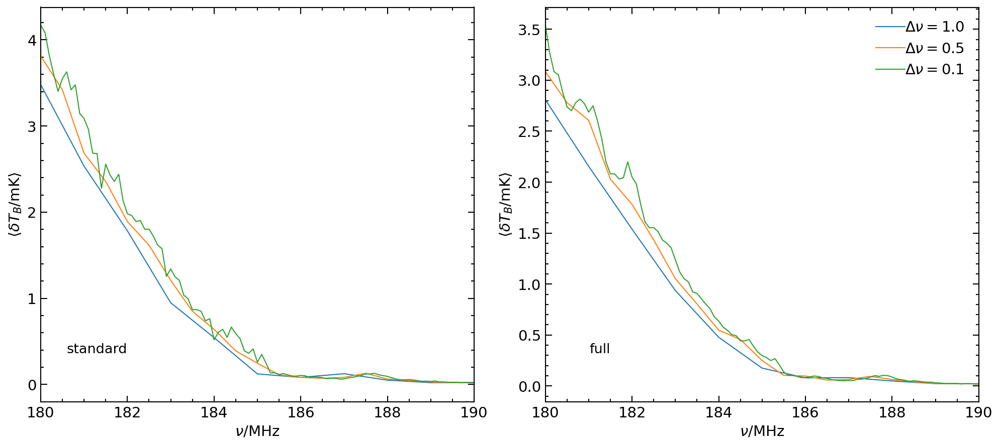

In [7]:
freq01 = np.arange(180, 200.1, 0.1)
freq05 = np.arange(180, 200.5, 0.5)
freq1 = np.arange(180, 201, 1)

TB_LC_z01_nu1_1deg = np.empty(LC_z01_nu1_1deg.shape[2])
TB_LC_z01_nu05_1deg = np.empty(LC_z01_nu05_1deg.shape[2])
TB_RSD_z01_nu05_1deg = np.empty(RSD_z01_nu05_1deg.shape[2])
TB_RSD_z01_nu1_1deg = np.empty(RSD_z01_nu1_1deg.shape[2])

for ii in range(0,RSD_z01_nu05_1deg.shape[2]):
    TB_RSD_z01_nu05_1deg[ii] = np.mean(RSD_z01_nu05_1deg[:,:,ii])
for ii in range(0,LC_z01_nu05_1deg.shape[2]):   
    TB_LC_z01_nu05_1deg[ii] = np.mean(LC_z01_nu05_1deg[:,:,ii])
for ii in range(0,LC_z01_nu1_1deg.shape[2]):
    TB_LC_z01_nu1_1deg[ii] = np.mean([LC_z01_nu1_1deg[:,:,ii]])
for ii in range(0,RSD_z01_nu1_1deg.shape[2]):
    TB_RSD_z01_nu1_1deg[ii] = np.mean([RSD_z01_nu1_1deg[:,:,ii]])
    
    


fig, ax = plt.subplots(figsize=(fig_width*2, fig_height),
                       nrows=1, ncols=2,)
ax[0].plot(freq1, TB_LC_z01_nu1_1deg, label=r'$\Delta \nu = 1.0 $')
ax[0].plot(freq05, TB_LC_z01_nu05_1deg, label=r'$\Delta \nu = 0.5 $')
ax[0].plot(freq01, TB_LC_z01_nu01_1deg, label=r'$\Delta \nu =0.1 $')
ax[0].set_ylabel(r'$\langle \delta T_B /\rm mK \rangle $', fontsize=14)
ax[0].text(0.2,0.15, 'standard',transform=ax[0].transAxes, ha='right', va='top', fontsize=13)
ax[0].set_xlabel(r'$\nu / \rm MHz$', fontsize=14)
ax[0].set_xlim(180,190)
ax[1].plot(np.arange(180, 191, 1), TB_RSD_z01_nu1_1deg, label=r'$\Delta \nu = 1.0 $ ')
ax[1].plot(np.arange(180, 190.5, 0.5), TB_RSD_z01_nu05_1deg, label=r'$\Delta \nu = 0.5 $ ')
ax[1].plot(np.arange(180, 190.1, 0.1), TB_RSD_z01_nu01_1deg, label=r'$\Delta \nu =0.1 $ ')
ax[1].set_ylabel(r'$\langle \delta T_B /\rm mK \rangle $', fontsize=14)
ax[1].text(0.15,0.15, 'full',transform=ax[1].transAxes, ha='right', va='top', fontsize=13)
ax[1].set_xlabel(r'$\nu / \rm MHz$', fontsize=14)
ax[1].set_xlim(180,190)
plt.tight_layout()
plt.legend(frameon=False, fontsize=14)
plt.savefig(base + 'graphs_for_paper/freq_res_global_temp_evo.pdf', dpi=330)
plt.show()

In [8]:

base = '/home/ppxjf3/RSD_LC/comparison/FINAL_LIGHTCONES_PEC_VEL_PAPER/'
npix=512
nfreq=401

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    RSD = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)

RSD_z01_nu01_1deg_140_180 = np.array(RSD)*1e3
RSD_z01_nu01_1deg_140_180 = RSD_z01_nu01_1deg_140_180.reshape(npix,npix,nfreq)
RSD_z01_nu01 = np.dstack((RSD_z01_nu01_1deg_140_180, RSD_z01_nu01_1deg))

        
with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.014978_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z01_nu01_1deg_140_180 = np.array(LC)*1e3
LC_z01_nu01_1deg_140_180 = LC_z01_nu01_1deg_140_180.reshape(npix,npix,nfreq)
LC_z01_nu01 = np.dstack((LC_z01_nu01_1deg_140_180, LC_z01_nu01_1deg))

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.014978_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.50.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z05_nu01_1deg_140_180 = np.array(LC)*1e3
LC_z05_nu01_1deg_140_180 = LC_z05_nu01_1deg_140_180.reshape(npix,npix,nfreq)
LC_z05_nu01 = np.dstack((LC_z05_nu01_1deg_140_180, LC_z05_nu01_1deg))

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.014978_div00.00_pv1_oneevent0_evo1_lcon1_dz_001.00.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z1_nu01_1deg_140_180 = np.array(LC)*1e3
LC_z1_nu01_1deg_140_180 = LC_z1_nu01_1deg_140_180.reshape(npix,npix,nfreq)
LC_z1_nu01 = np.dstack((LC_z1_nu01_1deg_140_180, LC_z1_nu01_1deg))

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.50.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z05_nu01_1deg_140_180 = np.array(LC)*1e3
RSD_z05_nu01_1deg_140_180 = RSD_z05_nu01_1deg_140_180.reshape(npix,npix,nfreq)
RSD_z05_nu01 = np.dstack((RSD_z05_nu01_1deg_140_180, RSD_z05_nu01_1deg))

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_001.00.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z1_nu01_1deg_140_180 = np.array(LC)*1e3
RSD_z1_nu01_1deg_140_180 = RSD_z1_nu01_1deg_140_180.reshape(npix,npix,nfreq)
RSD_z1_nu01 = np.dstack((RSD_z1_nu01_1deg_140_180, RSD_z1_nu01_1deg))

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.50MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z01_nu05_1deg_140_180 = np.array(LC)*1e3
RSD_z01_nu05_1deg_140_180 = RSD_z01_nu05_1deg_140_180.reshape(npix,npix,81)
RSD_z01_nu05 = np.dstack((RSD_z01_nu05_1deg_140_180, RSD_z01_nu05_1deg))

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.50MHz_180.00MHz_140.00MHz_ds0.014978_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z01_nu05_1deg_140_180 = np.array(LC)*1e3
LC_z01_nu05_1deg_140_180 = LC_z01_nu05_1deg_140_180.reshape(npix,npix,81)
LC_z01_nu05 = np.dstack((LC_z01_nu05_1deg_140_180, LC_z01_nu05_1deg))

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu1.00MHz_180.00MHz_140.00MHz_ds0.014978_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z01_nu1_1deg_140_180 = np.array(LC)*1e3
LC_z01_nu1_1deg_140_180 = LC_z01_nu1_1deg_140_180.reshape(npix,npix,41)
LC_z01_nu1 = np.dstack((LC_z01_nu1_1deg_140_180, LC_z01_nu1_1deg))

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu1.00MHz_180.00MHz_140.00MHz_ds0.005991_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z01_nu1_1deg_140_180 = np.array(LC)*1e3
RSD_z01_nu1_1deg_140_180 = RSD_z01_nu1_1deg_140_180.reshape(npix,npix,41)
RSD_z01_nu1 = np.dstack((RSD_z01_nu1_1deg_140_180, RSD_z01_nu1_1deg))



In [9]:
#get the difference, start with freq resolution
#make data
data = np.loadtxt('/home/ppxjf3/RSD_LC/comparison/FINAL_LIGHTCONES_PEC_VEL_PAPER/xHII_paper.txt')
zs = nu2z(np.array([145,155,165,175,185]))


xHI = np.interp(zs, data[0,:], data[1,:])
nu_01_05_RSD = np.empty_like(xHI)
nu_01_1_RSD = np.empty_like(xHI)

nu_01_05_LC = np.empty_like(xHI)
nu_01_1_LC = np.empty_like(xHI)


for ii in range(0, len(xHI)):
    hist1, bins1 = np.histogram(RSD_z01_nu01[:,:,ii*100:(ii*100+101)].reshape((512*512*101)), density =True)
    hist2, bins2 = np.histogram(RSD_z01_nu05[:,:,ii*20:(ii*20+21)].reshape((512*512*21)), density =True)
    nu_01_05_RSD[ii] = np.abs((sum(np.diff(bins1)*hist1)) - (sum(np.diff(bins2)*hist2)))
    hist1, bins1 = np.histogram(RSD_z01_nu01[:,:,ii*100:(ii*100+101)].reshape((512*512*101)), density =True)
    hist2, bins2 = np.histogram(RSD_z01_nu1[:,:,ii*10:(ii*10+11)].reshape((512*512*11)), density =True)
    nu_01_1_RSD[ii] =  np.abs((sum(np.diff(bins1)*hist1)) - (sum(np.diff(bins2)*hist2)))
    hist1, bins1 = np.histogram(LC_z01_nu01[:,:,ii*100:(ii*100+101)].reshape((512*512*101)), density =True)
    hist2, bins2 = np.histogram(LC_z01_nu05[:,:,ii*21:(ii*21+21)].reshape((512*512*21)), density =True)
    nu_01_05_LC[ii] =  np.abs((sum(np.diff(bins1)*hist1)) - (sum(np.diff(bins2)*hist2)))
    hist1, bins1 = np.histogram(LC_z01_nu01[:,:,ii*100:(ii*100+101)].reshape((512*512*101)), density =True)
    hist2, bins2 = np.histogram(LC_z01_nu1[:,:,ii*10:(ii*10+11)].reshape((512*512*11)), density =True)
    nu_01_1_LC[ii] = np.abs((sum(np.diff(bins1)*hist1)) - (sum(np.diff(bins2)*hist2)))
    print(ii)

0
1
2
3
4


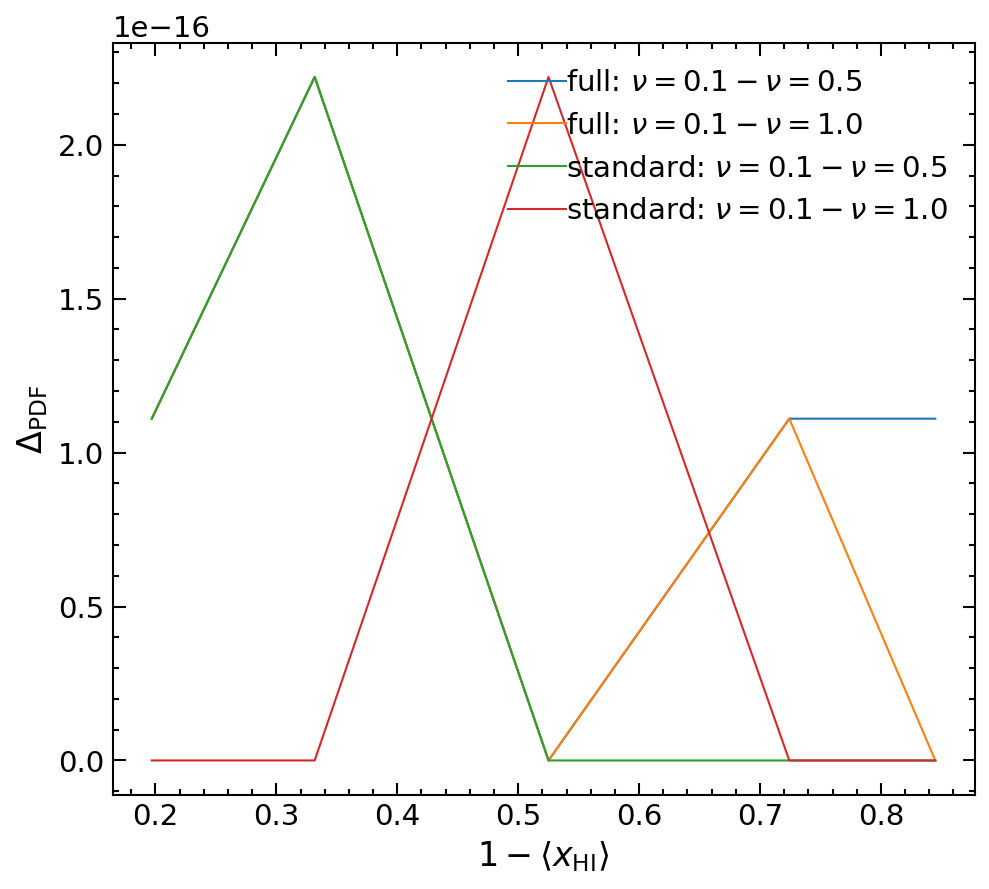

In [7]:

fig, ax = plt.subplots(figsize=(fig_width, fig_height),
                       nrows=1, ncols=1,)

ax.plot(xHI, nu_01_05_RSD, label=r'full: $\nu =0.1 - \nu =0.5$' )
ax.plot(xHI, nu_01_1_RSD, label=r'full: $\nu =0.1 - \nu =1.0$' )
ax.plot(xHI, nu_01_05_LC, label=r'standard: $\nu =0.1 - \nu =0.5$' )
ax.plot(xHI, nu_01_1_LC, label=r'standard: $\nu =0.1 - \nu =1.0$' )
ax.set_ylabel(r'$\Delta_{\rm PDF}$', fontsize=16)
ax.set_xlabel(r'$1 - \langle x_{\rm HI} \rangle$', fontsize=16)

plt.legend(frameon=False, fontsize=14)

plt.tight_layout()
plt.show()

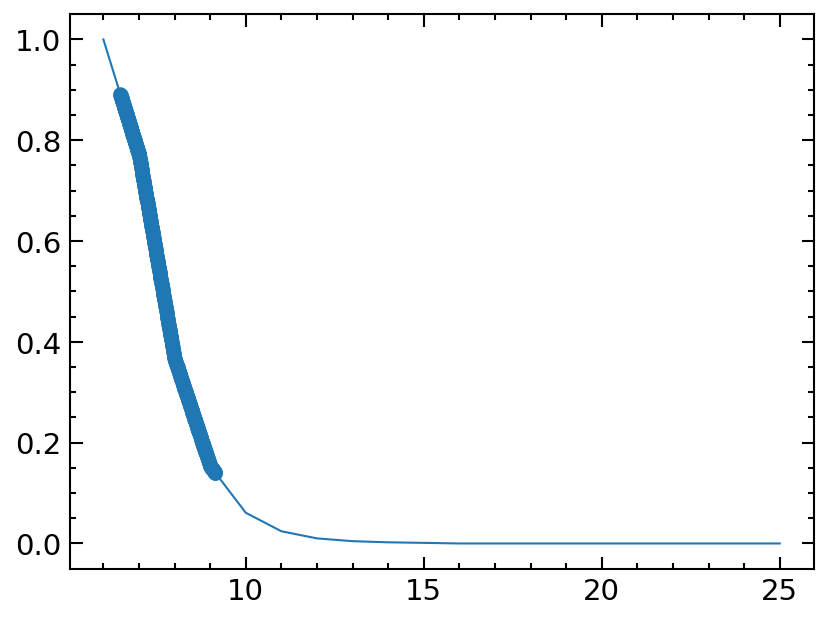

In [10]:

#make data
data = np.loadtxt('/home/ppxjf3/RSD_LC/comparison/FINAL_LIGHTCONES_PEC_VEL_PAPER/xHII_paper.txt')
zs = nu2z(np.linspace(140,190,501))


xHI = np.interp(zs, data[0,:], data[1,:])


plt.plot(data[0,:],data[1,:])
plt.scatter(zs, xHI)
plt.show()

#get the difference, start with freq resolution
z_01_05_RSD = np.empty_like(xHI)
z_01_1_RSD = np.empty_like(xHI)

z_01_05_LC = np.empty_like(xHI)
z_01_1_LC = np.empty_like(xHI)


for ii in range(0, 501):
    z_01_05_RSD[ii] = (np.mean(RSD_z01_nu01[:,:,ii]) - np.mean(RSD_z05_nu01[:,:,ii]))
    z_01_1_RSD[ii] =  (np.mean(RSD_z01_nu01[:,:,ii]) - np.mean(RSD_z1_nu01[:,:,ii]))
    z_01_05_LC[ii] =   (np.mean(LC_z01_nu01[:,:,ii]) - np.mean(LC_z05_nu01[:,:,ii]))
    z_01_1_LC[ii] =  (np.mean(LC_z01_nu01[:,:,ii]) - np.mean(LC_z1_nu01[:,:,ii]))


In [11]:
z_find = nu2z(185)
print(z_find)
print(np.argwhere(zs == z_find))
print(xHI[np.argwhere(zs == z_find)])

6.677864864864865
[[450]]
[[0.84503581]]


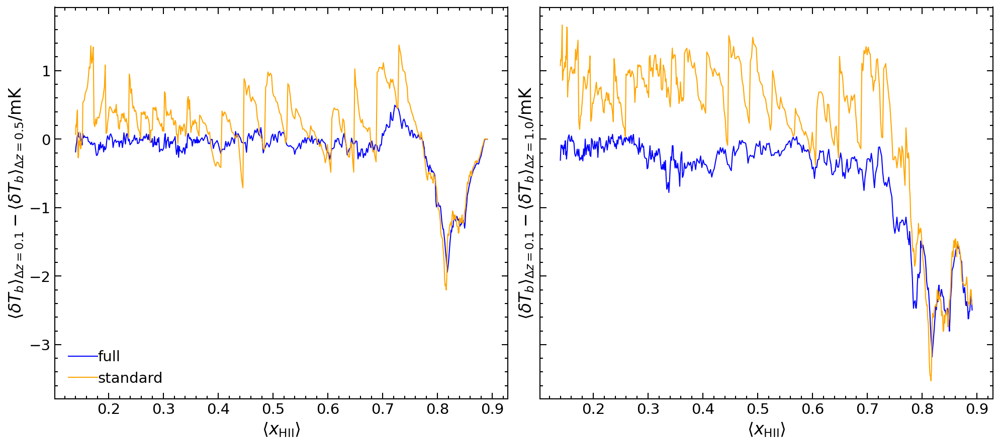

In [12]:

fig, ax = plt.subplots(figsize=(fig_width*2, fig_height),
                       nrows=1, ncols=2,sharey=True)

ax[0].plot(xHI, z_01_05_RSD, color='blue', label=r'full' )
ax[1].plot(xHI, z_01_1_RSD, color='blue')
ax[0].plot(xHI, z_01_05_LC, color='orange', label=r'standard' )
ax[1].plot(xHI, z_01_1_LC, color='orange')
ax[0].set_ylabel(r'$\langle \delta T_b \rangle_{\Delta z = 0.1}  - \langle \delta T_b \rangle_{\Delta z = 0.5} / \rm mK$', fontsize=16)
ax[0].set_xlabel(r'$ \langle x_{\rm HII} \rangle$', fontsize=16)
ax[1].set_ylabel(r'$\langle \delta T_b \rangle_{\Delta z = 0.1}  - \langle \delta T_b \rangle_{\Delta z = 1.0} / \rm mK$', fontsize=16)
ax[1].set_xlabel(r'$\langle x_{\rm HII} \rangle$', fontsize=16)
ax[0].legend(frameon=False, fontsize=14)

plt.tight_layout()
plt.savefig(base + 'graphs_for_paper/zres_xHIevolution.pdf', dpi=330, bbox_inches='tight')
plt.show()

In [4]:

base = '/home/ppxjf3/RSD_LC/comparison/FINAL_LIGHTCONES_PEC_VEL_PAPER/'
npix=512
nfreq=201

        
with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_200.00MHz_180.00MHz_ds0.016048_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z01_nu01_1deg = np.array(LC)*1e3
LC_z01_nu01_1deg = LC_z01_nu01_1deg.reshape(npix,npix,nfreq)

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_200.00MHz_180.00MHz_ds0.016048_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.50.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z01_nu001_1deg = np.array(LC)*1e3
LC_z01_nu001_1deg = LC_z01_nu001_1deg.reshape(npix,npix,nfreq)




with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.50MHz_200.00MHz_180.00MHz_ds0.016048_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z01_nu05_1deg = np.array(LC)*1e3
LC_z01_nu05_1deg = LC_z01_nu05_1deg.reshape(npix,npix,41)

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu1.00MHz_200.00MHz_180.00MHz_ds0.016048_div00.00_pv1_oneevent0_evo1_lcon1_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
LC_z01_nu1_1deg = np.array(LC)*1e3
LC_z01_nu1_1deg = LC_z01_nu1_1deg.reshape(npix,npix,21)

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu1.00MHz_190.00MHz_180.00MHz_ds0.006419_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z01_nu1_1deg = np.array(LC)*1e3
RSD_z01_nu1_1deg = RSD_z01_nu1_1deg.reshape(npix,npix,11)

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_190.00MHz_180.00MHz_ds0.006419_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.50.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z05_nu01_1deg = np.array(LC)*1e3
RSD_z05_nu01_1deg = RSD_z05_nu01_1deg.reshape(npix,npix,101)

with open(base +'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_200.00MHz_180.00MHz_ds0.005617_div00.00_pv1_oneevent0_evo1_lcon0_dz_001.00.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z1_nu01_1deg = np.array(LC)*1e3
RSD_z1_nu01_1deg = RSD_z1_nu01_1deg.reshape(npix,npix,201)


with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.50MHz_190.00MHz_180.00MHz_ds0.006419_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z01_nu05_1deg = np.array(LC)*1e3
RSD_z01_nu05_1deg = RSD_z01_nu05_1deg.reshape(npix,npix,21)

with open(base + 'LightconeRSD_N512_FOV1.0000_dnu0.10MHz_190.00MHz_180.00MHz_ds0.006419_div00.00_pv1_oneevent0_evo1_lcon0_dz_000.10.dat', "rb") as fid:
    # Read the binary data from the file
    data = fid.read()

    # Unpack the binary data into a tuple of floats
    LC = struct.unpack('f' * (len(data) // struct.calcsize('f')), data)
RSD_z01_nu01_1deg = np.array(LC)*1e3
RSD_z01_nu01_1deg = RSD_z01_nu01_1deg.reshape(npix,npix,101)


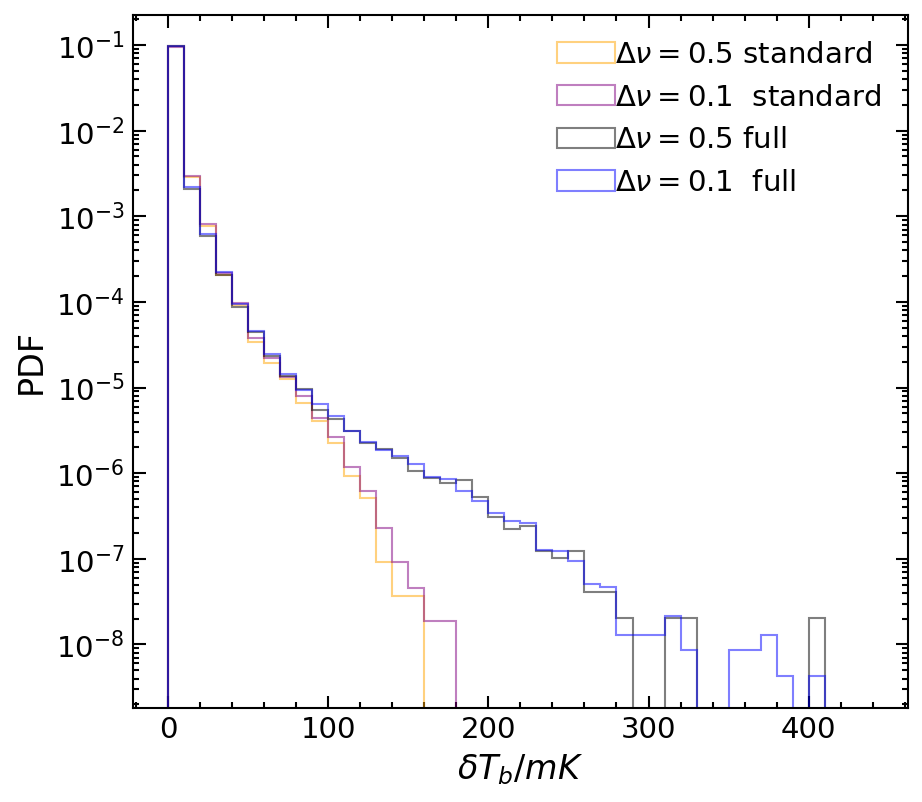

In [5]:
i0 = 0
i1 = 101


BINS = np.arange(0.0, 450.0,10.0)


fig, ax = plt.subplots(figsize=(fig_width, fig_height),
                       nrows=1, ncols=1,)
fig.subplots_adjust(wspace=0)
#ax.hist(LC_z01_nu1_1deg[:,:,i0:11].reshape((512*512*11)), bins=BINS, color='red', histtype='step', alpha=0.5, label=r'$\Delta \nu = 1.0$ standard', density =True)
ax.hist(LC_z01_nu05_1deg[:,:,i0:21].reshape((512*512*21)), bins=BINS, color='orange', histtype='step', alpha=0.5, label=r'$\Delta \nu = 0.5$ standard', density =True)
ax.hist(LC_z01_nu01_1deg[:,:,i0:i1].reshape((512*512*101)), bins=BINS, color='purple', histtype='step', alpha=0.5, label=r'$\Delta \nu = 0.1$  standard', density =True)

#ax.hist(RSD_z01_nu1_1deg[:,:,i0:11].reshape((512*512*11)), bins=BINS, color='green', histtype='step', alpha=0.5, label=r'$\Delta \nu = 1.0$ full', density =True)
ax.hist(RSD_z01_nu05_1deg[:,:,i0:21].reshape((512*512*21)), bins=BINS, color='k', histtype='step', alpha=0.5, label=r'$\Delta \nu = 0.5$ full', density =True)
ax.hist(RSD_z01_nu01_1deg[:,:,i0:i1].reshape((512*512*101)), bins=BINS, color='blue', histtype='step', alpha=0.5, label=r'$\Delta \nu = 0.1$  full', density =True)
ax.set_yscale('log')
ax.set_ylabel(r'PDF', fontsize=16)
ax.set_xlabel(r'$\delta T_b /mK$', fontsize=16)
plt.legend(frameon=False, fontsize=14)
plt.savefig(base + 'graphs_for_paper/freq_resolution_pdf.pdf', dpi=330, bbox_inches='tight')
plt.show()